In [137]:
import os
import sys
import json
import numpy as np
import time
from PIL import Image, ImageDraw

ROOT_DIR = './'

sys.path.append(ROOT_DIR) 
from mrcnn.config import Config
import mrcnn.utils as utils
from mrcnn import visualize
import mrcnn.model as modellib

In [2]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

In [3]:
class TrainConfig(Config):
    # Give the configuration a recognizable name
    NAME = "custom"

    # Train on 1 GPU and 1 image per GPU. Batch size is 1 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 5

    LEARNING_RATE = 0.001

    # Number of classes (including background)
    NUM_CLASSES = 1 + 2  # background + 2 (red, green)

    # All of our training images are 1920x1012
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    
    # Matterport originally used resnet101, but I downsized to fit it on my graphics card
    BACKBONE = 'resnet50' # resnet50

    # To be honest, I haven't taken the time to figure out what these do
    RPN_ANCHOR_SCALES = (32, 64, 128, 256, 512)
    TRAIN_ROIS_PER_IMAGE = 32
    MAX_GT_INSTANCES = 50 
    POST_NMS_ROIS_INFERENCE = 500 
    POST_NMS_ROIS_TRAINING = 1000 
    
config = TrainConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     5
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 5
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

In [4]:
class CocoLikeDataset(utils.Dataset):
    def load_data(self, annotation_json, images_dir):
        # Load json from file
        json_file = open(annotation_json)
        coco_json = json.load(json_file)
        json_file.close()
        
        # Add the class names using the base method from utils.Dataset
        source_name = "coco_like"
        for category in coco_json['categories']:
            class_id = category['id']
            class_name = category['name']
            if class_id < 1:
                print('Error: Class id for "{}" cannot be less than one. (0 is reserved for the background)'.format(class_name))
                return
            
            self.add_class(source_name, class_id, class_name)
        
        # Get all annotations
        annotations = {}
        for annotation in coco_json['annotations']:
            image_id = annotation['image_id']
            if image_id not in annotations:
                annotations[image_id] = []
            annotations[image_id].append(annotation)
        
        # Get all images and add them to the dataset
        seen_images = {}
        for image in coco_json['images']:
            image_id = image['id']
            if image_id in seen_images:
                print("Warning: Skipping duplicate image id: {}".format(image))
            else:
                seen_images[image_id] = image
                try:
                    image_file_name = image['file_name']
                    image_width = image['width']
                    image_height = image['height']
                except KeyError as key:
                    print("Warning: Skipping image (id: {}) with missing key: {}".format(image_id, key))
                
                image_path = os.path.abspath(os.path.join(images_dir, image_file_name))
                image_annotations = annotations[image_id]
                
                # Add the image using the base method from utils.Dataset
                self.add_image(
                    source=source_name,
                    image_id=image_id,
                    path=image_path,
                    width=image_width,
                    height=image_height,
                    annotations=image_annotations
                )
                
    def load_mask(self, image_id):
        image_info = self.image_info[image_id]
        annotations = image_info['annotations']
        instance_masks = []
        class_ids = []
        
        for annotation in annotations:
            class_id = annotation['category_id']
            mask = Image.new('1', (image_info['width'], image_info['height']))
            mask_draw = ImageDraw.ImageDraw(mask, '1')
            for segmentation in annotation['segmentation']:
                mask_draw.polygon(segmentation, fill=1)
                bool_array = np.array(mask) > 0
                instance_masks.append(bool_array)
                class_ids.append(class_id)

        mask = np.dstack(instance_masks)
        class_ids = np.array(class_ids, dtype=np.int32)
        
        return mask, class_ids

Train, Valid 데이터 확인

In [ ]:
dataset_train = CocoLikeDataset()
dataset_train.load_data('/home/elicer/jm/train/노상/output/train/train.json', '/home/elicer/jm/train/노상/output/train/images/')
dataset_train.prepare()

dataset_val = CocoLikeDataset()
dataset_val.load_data('/home/elicer/jm/train/노상/output/val/val.json', '/home/elicer/jm/train/노상/output/val/images/')
dataset_val.prepare()

image_ids = np.random.choice(dataset_train.image_ids, 4)

print('Train', len(dataset_train.image_ids))
print('Validation', len(dataset_val.image_ids))

for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)

학습

In [6]:
model = modellib.MaskRCNN(
    mode="training",
    config=config,
    model_dir=MODEL_DIR)

# model.load_weights(
#     COCO_MODEL_PATH,
#     by_name=True,
#     exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"])

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.


2024-08-27 06:18:27.381757: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2024-08-27 06:18:27.562165: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:e3:00.0 name: NVIDIA A100 80GB PCIe computeCapability: 8.0
coreClock: 1.41GHz coreCount: 108 deviceMemorySize: 79.15GiB deviceMemoryBandwidth: 1.76TiB/s
2024-08-27 06:18:27.562208: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2024-08-27 06:18:27.585236: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2024-08-27 06:18:27.585328: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublasLt.so.11
2024-08-27 06:18:27.588909: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcufft.

In [17]:
# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.
start_train = time.time()

model.train(
    dataset_train,
    dataset_val, 
    learning_rate=config.LEARNING_RATE, 
    epochs=10, 
    layers='heads')

end_train = time.time()
minutes = round((end_train - start_train) / 60, 2)

print(f'Training took {minutes} minutes')


Starting at epoch 0. LR=0.001

Checkpoint Path: ./logs/custom20240827T0201/mask_rcnn_custom_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDistributed)
mrcnn_bbox_fc          (TimeDistributed)
mrcnn_mask_deconv      (TimeDistributed)


/home/elicer/anaconda3/envs/jm/lib/python3.8/site-packages/tensorflow/python/framework/indexed_slices.py:447: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training_2/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/sub:0", shape=(None,), dtype=int32), values=Tensor("training_2/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/GatherV2_2:0", shape=(None, 7, 7, 256), dtype=float32), dense_shape=Tensor("training_2/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/Shape:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(
/home/elicer/anaconda3/envs/jm/lib/python3.8/site-packages/tensorflow/python/framework/indexed_slices.py:447: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training_2/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/sub_1:0", shape=(None,), dtype=int32), values=Tensor("training_2/SGD/gradients/gradients/

  1/130 [..............................] - ETA: 14:19 - batch: 0.0000e+00 - size: 5.0000 - loss: 16.1705 - rpn_class_loss: 2.6338 - rpn_bbox_loss: 8.8736 - mrcnn_class_loss: 0.4765 - mrcnn_bbox_loss: 3.4614 - mrcnn_mask_loss: 0.7251

2024-08-27 02:02:37.509128: I tensorflow/core/profiler/lib/profiler_session.cc:126] Profiler session initializing.
2024-08-27 02:02:37.509178: I tensorflow/core/profiler/lib/profiler_session.cc:141] Profiler session started.
2024-08-27 02:02:38.297266: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2024-08-27 02:02:38.297735: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1743] CUPTI activity buffer flushed
2024-08-27 02:02:38.408007: I tensorflow/core/profiler/internal/gpu/cupti_collector.cc:673]  GpuTracer has collected 3553 callback api events and 3572 activity events. 
2024-08-27 02:02:38.501997: I tensorflow/core/profiler/lib/profiler_session.cc:159] Profiler session tear down.
2024-08-27 02:02:38.573301: I tensorflow/core/profiler/rpc/client/save_profile.cc:137] Creating directory: ./logs/custom20240827T0201/plugins/profile/2024_08_27_02_02_38
2024-08-27 02:02:38.651904: I tensorflow/core/profiler/rpc/client/save_profile.cc:143] 

  2/130 [..............................] - ETA: 3:37 - batch: 0.5000 - size: 5.0000 - loss: 12.8969 - rpn_class_loss: 1.7467 - rpn_bbox_loss: 7.7246 - mrcnn_class_loss: 0.2689 - mrcnn_bbox_loss: 2.4603 - mrcnn_mask_loss: 0.6964     

2024-08-27 02:02:38.750462: I tensorflow/core/profiler/rpc/client/save_profile.cc:137] Creating directory: ./logs/custom20240827T0201/plugins/profile/2024_08_27_02_02_38
2024-08-27 02:02:38.760842: I tensorflow/core/profiler/rpc/client/save_profile.cc:143] Dumped gzipped tool data for memory_profile.json.gz to ./logs/custom20240827T0201/plugins/profile/2024_08_27_02_02_38/7615c31e1e7b.memory_profile.json.gz
2024-08-27 02:02:38.764326: I tensorflow/core/profiler/rpc/client/capture_profile.cc:251] Creating directory: ./logs/custom20240827T0201/plugins/profile/2024_08_27_02_02_38Dumped tool data for xplane.pb to ./logs/custom20240827T0201/plugins/profile/2024_08_27_02_02_38/7615c31e1e7b.xplane.pb
Dumped tool data for overview_page.pb to ./logs/custom20240827T0201/plugins/profile/2024_08_27_02_02_38/7615c31e1e7b.overview_page.pb
Dumped tool data for input_pipeline.pb to ./logs/custom20240827T0201/plugins/profile/2024_08_27_02_02_38/7615c31e1e7b.input_pipeline.pb
Dumped tool data for tensor

130/130 [==============================] - ETA: 0s - batch: 64.5000 - size: 5.0000 - loss: 5.1891 - rpn_class_loss: 0.4149 - rpn_bbox_loss: 2.9072 - mrcnn_class_loss: 0.2662 - mrcnn_bbox_loss: 1.0279 - mrcnn_mask_loss: 0.5730

/home/elicer/anaconda3/envs/jm/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


130/130 [==============================] - 133s 977ms/step - batch: 64.5000 - size: 5.0000 - loss: 5.1891 - rpn_class_loss: 0.4149 - rpn_bbox_loss: 2.9072 - mrcnn_class_loss: 0.2662 - mrcnn_bbox_loss: 1.0279 - mrcnn_mask_loss: 0.5730 - val_loss: 3.2127 - val_rpn_class_loss: 0.1897 - val_rpn_bbox_loss: 1.7229 - val_mrcnn_class_loss: 0.3038 - val_mrcnn_bbox_loss: 0.4954 - val_mrcnn_mask_loss: 0.5008
Epoch 2/10
130/130 [==============================] - 103s 797ms/step - batch: 64.5000 - size: 5.0000 - loss: 2.8084 - rpn_class_loss: 0.1479 - rpn_bbox_loss: 1.5267 - mrcnn_class_loss: 0.2115 - mrcnn_bbox_loss: 0.4482 - mrcnn_mask_loss: 0.4740 - val_loss: 2.3711 - val_rpn_class_loss: 0.1180 - val_rpn_bbox_loss: 1.2688 - val_mrcnn_class_loss: 0.2072 - val_mrcnn_bbox_loss: 0.3545 - val_mrcnn_mask_loss: 0.4226
Epoch 3/10
130/130 [==============================] - 102s 789ms/step - batch: 64.5000 - size: 5.0000 - loss: 2.2898 - rpn_class_loss: 0.1107 - rpn_bbox_loss: 1.1313 - mrcnn_class_loss: 0

평가 지표 출력 함수

In [7]:
import json
import os
import numpy as np
from PIL import Image, ImageDraw
from mrcnn.utils import Dataset
import skimage.io
import skimage.draw
from sklearn.metrics import accuracy_score, jaccard_score, precision_recall_curve, auc

In [8]:
def evaluate_model(model, dataset):
    pixel_accuracies = []
    ious = []
    average_precisions = []

    for i in range(len(dataset.image_ids)):
        img_id = dataset.image_ids[i]
        img_path = dataset.image_info[img_id]['path']

        # 이미지 로드
        img = skimage.io.imread(img_path)
        true_mask, _ = dataset.load_mask(img_id)
        true_mask = true_mask[:, :, 0]  # 첫 번째 마스크 사용

        # 모델 예측
        results = model.detect([img], verbose=0)

        # 예측된 마스크가 있는지 확인하고 처리
        if 'masks' in results[0] and results[0]['masks'].size > 0:
            pred_mask = results[0]['masks'][:, :, 0]  # 첫 번째 마스크 사용
        else:
            # 예측된 마스크가 없을 경우, 모든 값이 0인 마스크 생성
            pred_mask = np.zeros(true_mask.shape, dtype=bool)

        # 크기 조정 및 이진화
        pred_mask_resized = skimage.transform.resize(pred_mask, true_mask.shape, preserve_range=True)
        pred_mask_binary = pred_mask_resized > 0.5

        # 픽셀 정확도 계산
        pixel_accuracy = accuracy_score(true_mask.flatten(), pred_mask_binary.flatten())
        pixel_accuracies.append(pixel_accuracy)

        # IoU 계산
        iou = jaccard_score(true_mask.flatten(), pred_mask_binary.flatten())
        ious.append(iou)

        # Precision-Recall 계산 (이진화된 마스크 사용)
        precision, recall, _ = precision_recall_curve(true_mask.flatten(), pred_mask_binary.flatten())
        if len(recall) > 0 and len(precision) > 0:  # 빈 리스트가 아닌지 확인
            ap = auc(recall, precision)
            average_precisions.append(ap)

    return {
        'pixel_accuracy': np.mean(pixel_accuracies),
        'iou': np.mean(ious),
        'mAP': np.mean(average_precisions) if average_precisions else 0  # AP 계산이 성공한 경우에만
    }


평가 지표 출력 (Pixel Accuracy, IoU, mAP)

In [9]:
# Mask R-CNN 설정
class InferenceConfig(Config):
    NAME = "custom"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 2  # 배경 + 클래스 수

config = InferenceConfig()
model_path = '/home/elicer/jm/Mask_RCNN/logs/custom20240827T0201/mask_rcnn_custom_0010.h5'
model = modellib.MaskRCNN(mode="inference", config=config, model_dir=model_path)
model.load_weights(model_path, by_name=True)

results = evaluate_model(model, dataset_val)

Instructions for updating:
Use fn_output_signature instead


2024-08-27 06:18:43.054677: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-27 06:18:43.060209: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:e3:00.0 name: NVIDIA A100 80GB PCIe computeCapability: 8.0
coreClock: 1.41GHz coreCount: 108 deviceMemorySize: 79.15GiB deviceMemoryBandwidth: 1.76TiB/s
2024-08-27 06:18:43.064015: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1871] Adding visible gpu devices: 0
2024-08-27 06:18:43.064086: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2024-08-27 06:18:43.220282: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1258] Device interconnec

Re-starting from epoch 10


/home/elicer/anaconda3/envs/jm/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '
2024-08-27 06:18:49.461317: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2024-08-27 06:18:50.166025: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8100
2024-08-27 06:18:50.901415: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-08-27 06:18:50.901451: W tensorflow/stream_executor/gpu/asm_compiler.cc:56] Couldn't invoke ptxas --version
2024-08-27 06:18:50.902197: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-0

In [101]:
print(f"Pixel Accuracy: {results['pixel_accuracy']}")
print(f"IoU: {results['iou']}")
print(f"mAP: {results['mAP']}")

Pixel Accuracy: 0.8757907500899417
IoU: 0.07328536061047881
mAP: 0.41895304422855273


Ground Truth, Prediction 시각화

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   11.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


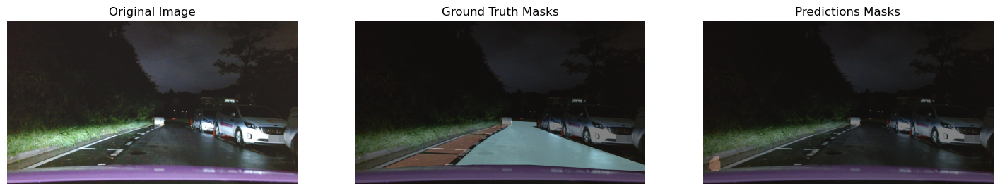

In [186]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import random
from mrcnn import model as modellib

def get_category_colors(dataset):
    """ Generate colors for each category """
    num_categories = len(dataset.class_info)
    colors = plt.cm.get_cmap('tab20', num_categories)
    return {i: colors(i) for i in range(num_categories)}

def load_image(image_id, dataset):
    """ Load image from dataset """
    image_info = dataset.image_info[image_id]
    image_path = image_info['path']
    image = Image.open(image_path)
    return np.array(image)

def get_annotations(image_id, dataset):
    """ Get ground truth annotations for a given image_id """
    mask, class_ids = dataset.load_mask(image_id)
    return mask, class_ids

def create_color_mask(mask, class_ids, category_colors):
    """ Create a color mask from class IDs """
    height, width, num_classes = mask.shape
    color_mask = np.zeros((height, width, 3), dtype=np.uint8)
    for i in range(num_classes):
        mask_i = mask[:, :, i]
        color = np.array(category_colors[class_ids[i]])[:3] * 255  # Convert from [0,1] to [0,255]
        color_mask[mask_i > 0] = color
    return color_mask

def display_images(image, gt_color_mask, pred_color_mask):
    """ Display original image, ground truth masks, and predictions """
    plt.figure(figsize=(18, 12))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')

    # Ground Truth Masks
    plt.subplot(1, 3, 2)
    plt.imshow(image)
    plt.imshow(gt_color_mask, alpha=0.5)
    plt.title('Ground Truth Masks')
    plt.axis('off')

    # Predictions Masks
    plt.subplot(1, 3, 3)
    plt.imshow(image)
    plt.imshow(pred_color_mask, alpha=0.5)
    plt.title('Predictions Masks')
    plt.axis('off')

    plt.show()

def predict_and_visualize(image_id, dataset, model):
    """ Predict and visualize results """
    image = load_image(image_id, dataset)
    results = model.detect([image], verbose=1)
    r = results[0]

    # Ground Truth
    gt_masks, gt_class_ids = get_annotations(image_id, dataset)
    category_colors = get_category_colors(dataset)
    gt_color_mask = create_color_mask(gt_masks, gt_class_ids, category_colors)

    # Predictions
    pred_masks = r['masks']
    pred_class_ids = r['class_ids']
    pred_color_mask = create_color_mask(pred_masks, pred_class_ids, category_colors)
    
    # Visualization
    display_images(image, gt_color_mask, pred_color_mask)

# Randomly select an image ID
image_id = random.choice(dataset_val.image_ids)

# Predict and visualize
predict_and_visualize(image_id, dataset_val, model)


모델 테스트

In [128]:
class InferenceConfig(TrainConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE = 0.85

inference_config = InferenceConfig()

# Recreate the model in inference mode
test_model = modellib.MaskRCNN(
    mode="inference", 
    config=inference_config,
    model_dir=MODEL_DIR)

model_path = '/home/elicer/jm/Mask_RCNN/logs/custom20240827T0201/mask_rcnn_custom_0010.h5'
# model_path = test_model.find_last()
print(model_path)

test_model.load_weights(model_path, by_name=True)

/home/elicer/jm/Mask_RCNN/logs/custom20240827T0201/mask_rcnn_custom_0010.h5
Re-starting from epoch 10


모델 테스트 시각화

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   29.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


/home/elicer/anaconda3/envs/jm/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


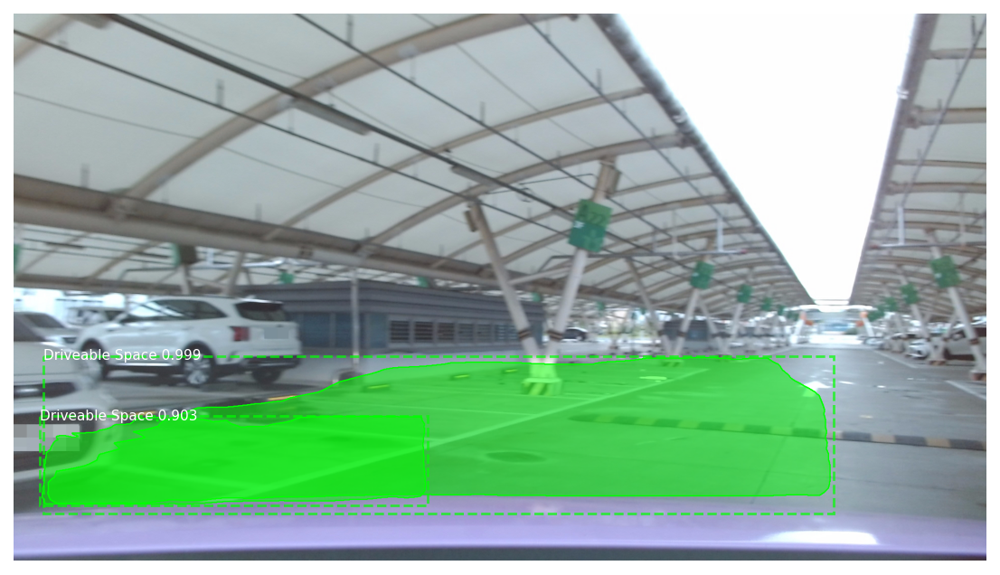

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   29.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


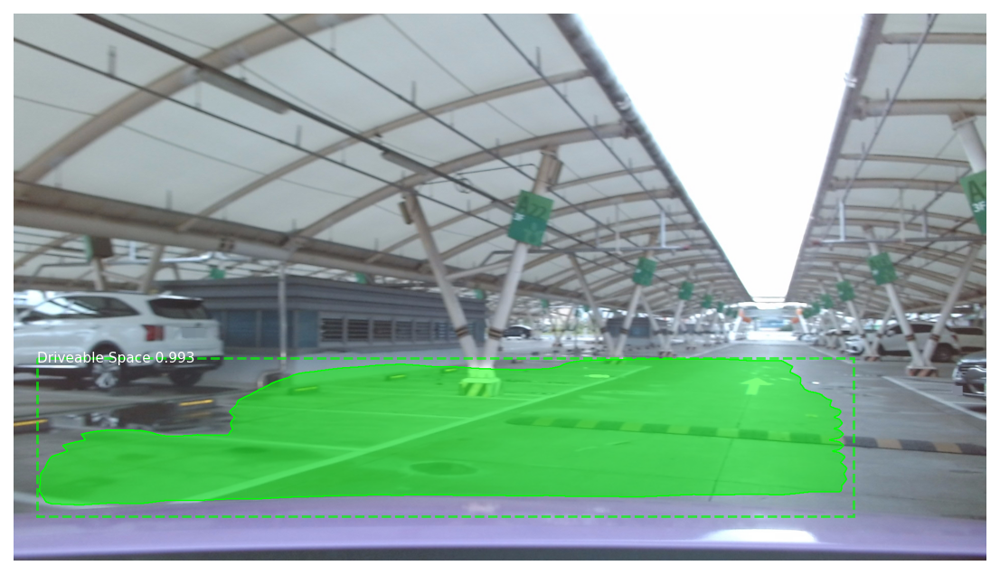

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   27.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


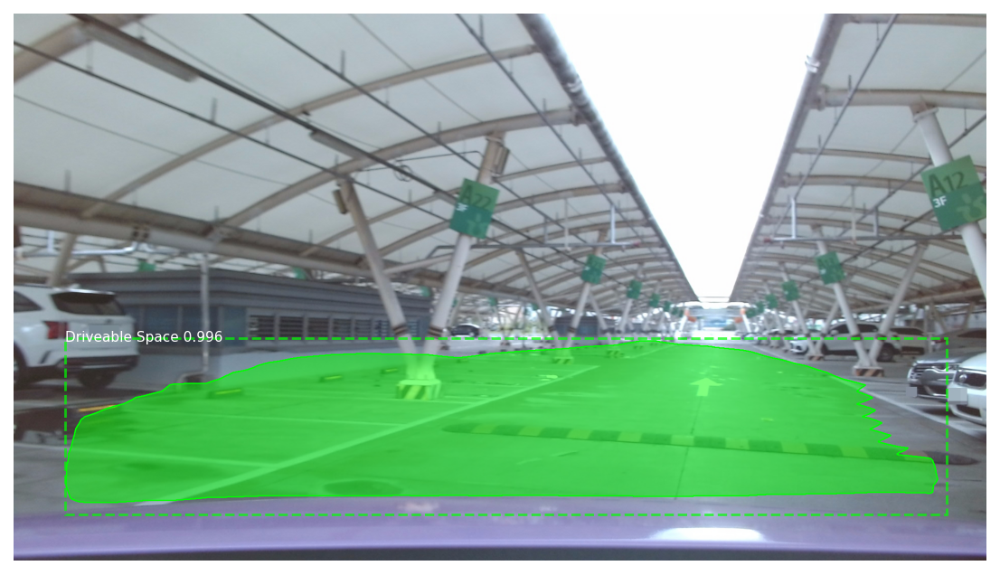

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   22.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


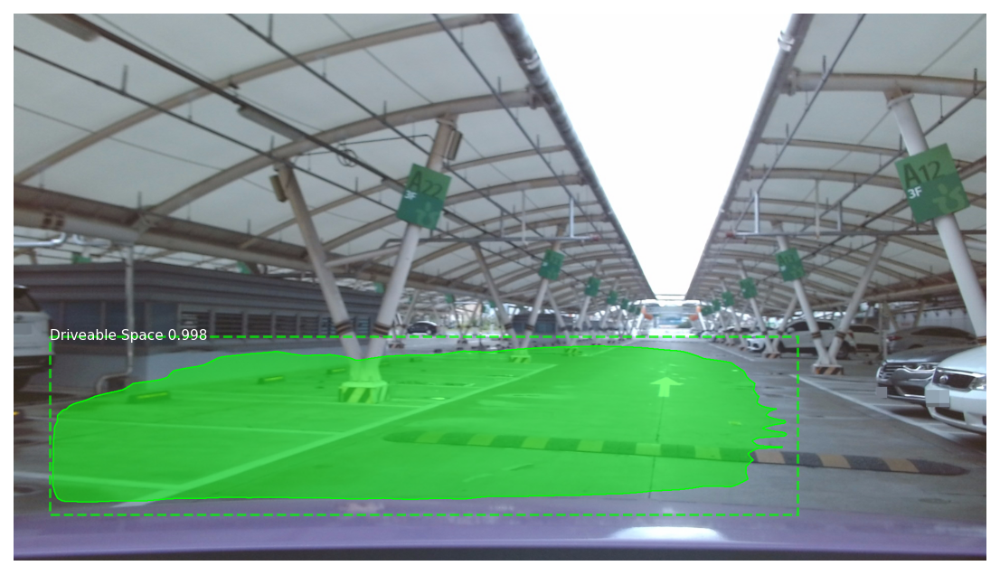

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   17.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


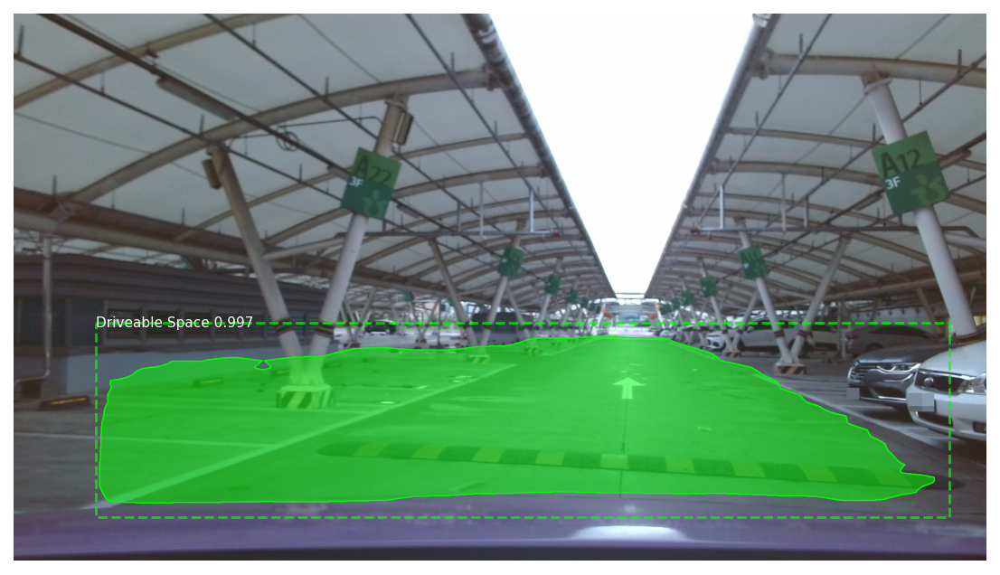

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   21.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


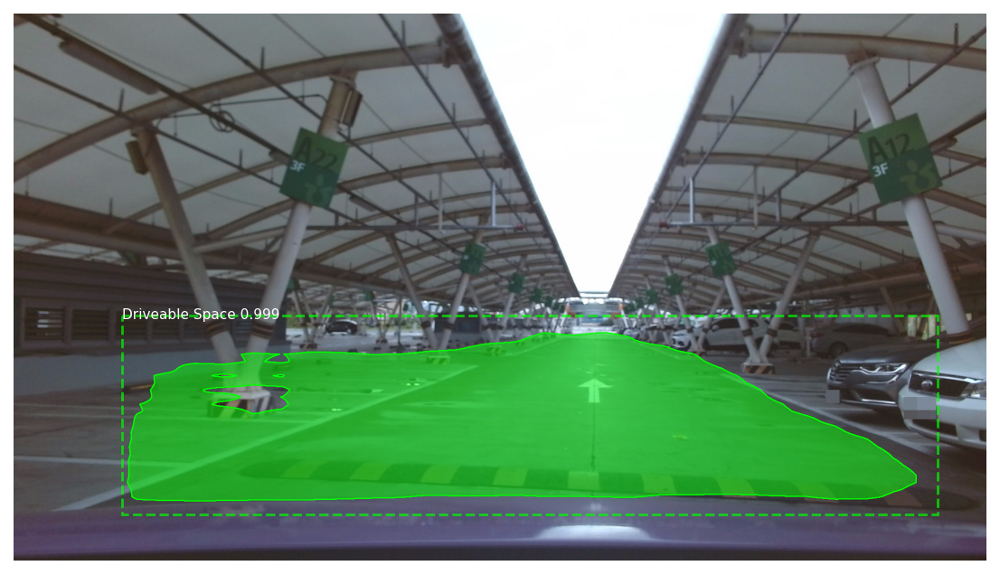

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   16.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


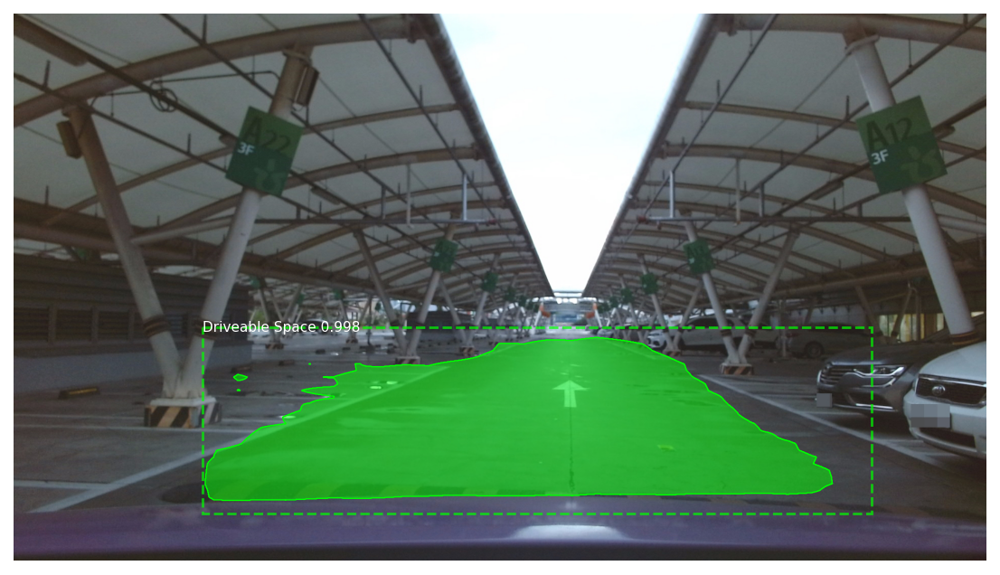

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   18.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


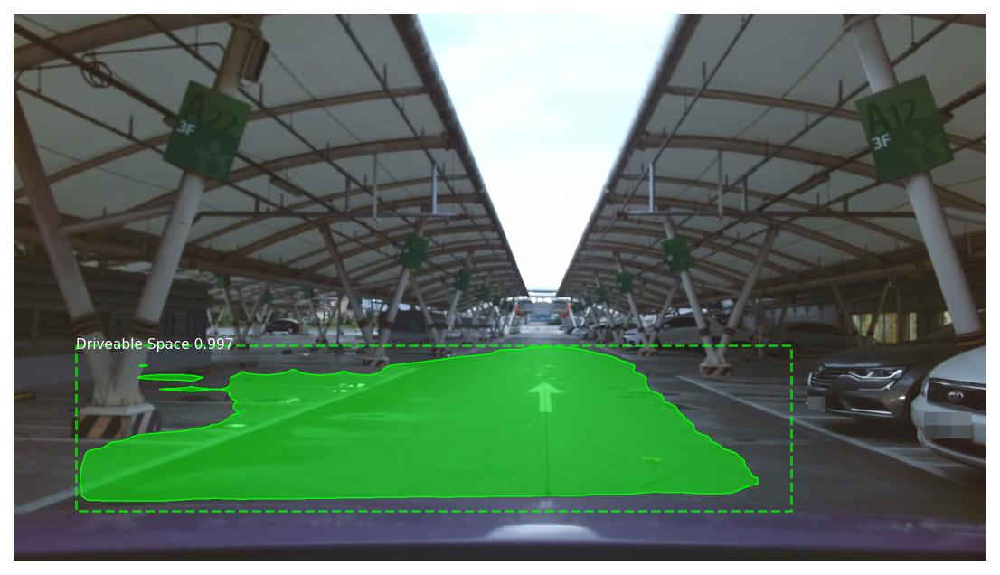

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   18.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


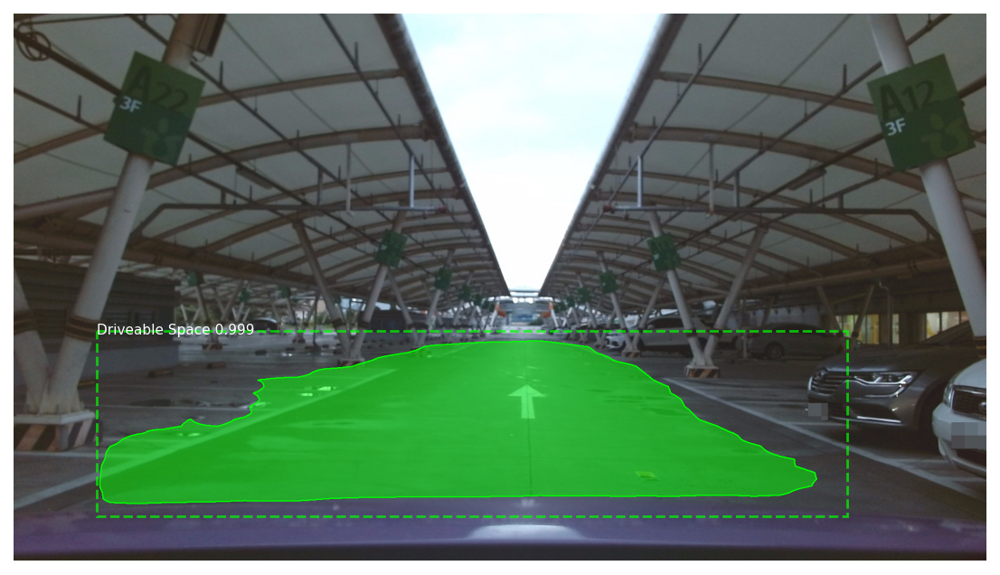

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   14.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


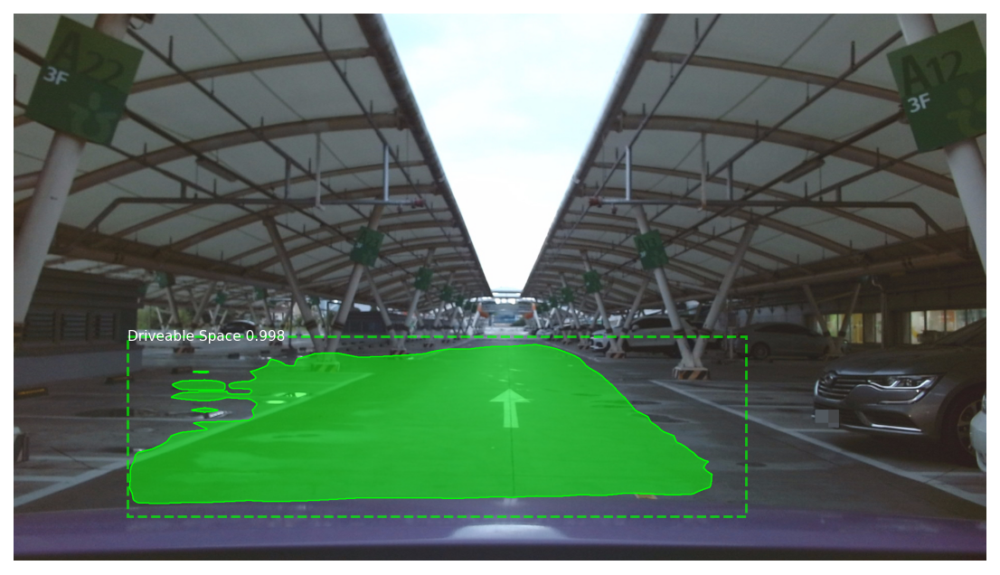

Processing 1 images
image                    shape: (1080, 1920, 3)       min:   17.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


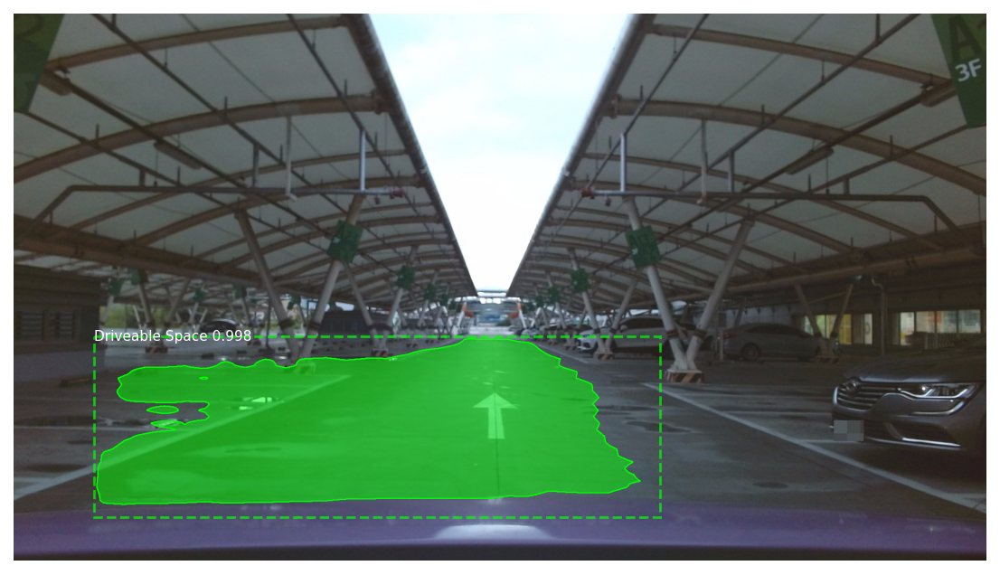

In [132]:
import skimage

mask_colors = [
    (0., 0., 0.), # Background
    (1., 0., 0.), # Red
    (0., 1., 0.)  # Green
]

real_test_dir = '/home/elicer/jm/train/test'
image_paths = []

for filename in os.listdir(real_test_dir):
    if os.path.splitext(filename)[1].lower() in ['.png', '.jpg', '.jpeg']:
        image_paths.append(os.path.join(real_test_dir, filename))

for image_path in image_paths:
    img = skimage.io.imread(image_path)
    img_arr = np.array(img)

    results = test_model.detect([img_arr], verbose=1)
    r = results[0]

    colors = tuple(np.take(mask_colors, r['class_ids'], axis=0))

    visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], 
                                dataset_val.class_names, r['scores'], figsize=(16, 8),
                                colors=colors)